
# Analyze Errors and Explore Interpretability of Models

This notebook demonstrates how to use the Responsible AI Widget's Error Analysis dashboard to understand a model trained on the Breast Cancer dataset. The goal of this sample notebook is to classify breast cancer diagnosis with scikit-learn and explore model errors and explanations:

1. Train a LightGBM classification model using Scikit-learn
2. Run Interpret-Community's 'explain_model' globally and locally to generate model explanations.
3. Visualize model errors and global and local explanations with the Error Analysis visualization dashboard.

## Install Required Packages

In [ ]:
# %pip install --upgrade interpret-community
# %pip install --upgrade raiwidgets

!pip install interpret
!pip install interpret interpret-core
!pip install interpret_community
!pip install raiwidgets
!pip install tensorflow==2.12.0
!pip install --upgrade numba
!pip show numba
!pip install explainerdashboard

  Using cached interpret-0.4.4-py3-none-any.whl (1.4 kB)
  Using cached interpret_core-0.4.4-py3-none-any.whl (16.9 MB)
  Using cached salib-1.4.7-py3-none-any.whl (757 kB)
  Using cached dash-2.14.1-py3-none-any.whl (10.4 MB)
  Using cached dash_core_components-2.0.0-py3-none-any.whl (3.8 kB)
  Using cached dash_html_components-2.0.0-py3-none-any.whl (4.1 kB)
  Using cached dash_table-5.0.0-py3-none-any.whl (3.9 kB)
  Using cached dash_cytoscape-0.3.0-py3-none-any.whl (3.6 MB)
  Using cached gevent-23.9.1-cp310-cp310-manylinux_2_28_x86_64.whl (6.4 MB)
  Using cached lime-0.2.0.1-py3-none-any.whl
  Using cached skope_rules-1.0.1-py3-none-any.whl (14 kB)
  Using cached shap-0.43.0-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (532 kB)
  Using cached dill-0.3.7-py3-none-any.whl (115 kB)
  Using cached retrying-1.3.4-py3-none-any.whl (11 kB)
  Using cached ansi2html-1.8.0-py3-none-any.whl (16 kB)
  Using cached zope.event-5.0-py3-non

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 71.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 34.1 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.14.0
    Uninstalling tensorflow-estimator-2.14.0:
      Successfully uninstalled tensorflow-estimator-2.14.0
  Attempting uninstall: keras
    Found existing installation: keras 2.14.0
    Uninstalling keras-2.14.0:
      Successfully uninstalled keras-2.14.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.4
    Uninstalling gast-0.5.4:
      Successfully uninstalled gast-0.5.4
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.14.1
    Uninstalling tensorboard-2.14.1:
      Successfully uninstalled tensorboard-2.1

## Explain

### Run model explainer at training time

In [ ]:
import pandas as pd

In [ ]:
data_int= pd.read_csv("/content/mmWave.csv" )

In [ ]:
data_int = data_int[data_int['isConsistent']==True]
#data_test_int = data_test_int[data_test_int['isConsistent']==True]

data_int = data_int[['DiffractionLoss', 'FoliageLoss','Distance','V','WorstKnifeEdgeDistance','RayExists','RayTotalLength','NumberOfReflection','NumberOfDiffraction','ReferencePathloss']]
#data_test_int = data_test_int[['DiffractionLoss', 'FoliageLoss','Distance','V','WorstKnifeEdgeDistance','RayExists','RayTotalLength','NumberOfReflection','NumberOfDiffraction','ReferencePathloss']]

data_train_int=data_int.sample(frac =0.75)

data_test_int = data_int.drop(labels=data_train_int.index)

In [ ]:
      # Input features and output from training set
      import numpy as np
      data_train= data_train_int
      data_test= data_test_int
#     X_train = np.array(data_train.drop('ReferencePathloss', axis = 1))    # Input Variables/features
      X_train = data_train.drop('ReferencePathloss', axis = 1)    # Input Variables/features
#     y_train = np.array(data_train.ReferencePathloss)    # output variables/features
      y_train = data_train.ReferencePathloss    # output variables/features

      # Input features and output from testing set
#     X_test = np.array(data_test.drop('ReferencePathloss', axis = 1))    # Input Variables/features
      X_test = data_test.drop('ReferencePathloss', axis = 1)    # Input Variables/features
#     y_test = np.array(data_test.ReferencePathloss)    # output variables/features
      y_test = data_test.ReferencePathloss    # output variables/features


In [ ]:
      from keras.optimizers import RMSprop
      from keras.models import Sequential
      from keras.layers import Dense
      import tensorflow as tf
      input_dim = X_train.shape[1]
      # Build the model
      batch_size_hp=16
      epochs_hp=150
      neuron_hp=32
      optimizer=RMSprop(0.01)
      model_hp = Sequential()
      model_hp.add(Dense(neuron_hp, activation=tf.nn.relu, kernel_initializer='uniform',
                input_dim = input_dim))
      model_hp.add(Dense(1, kernel_initializer='uniform', activation=None))

      # compile the model
      model_hp.compile(loss='mean_squared_error',
              optimizer=optimizer,
              metrics=[tf.keras.metrics.MeanSquaredError()])
      model_hp_history = model_hp.fit(X_train, y_train,
                    batch_size=batch_size_hp,
                    epochs=epochs_hp,
                    verbose=1,
                    validation_data=(X_test, y_test))

Epoch 1/150
62/62 [==============================] - 1s 7ms/step - loss: 4073.7102 - mean_squared_error: 4073.7102 - val_loss: 913.1719 - val_mean_squared_error: 913.1719
Epoch 2/150
62/62 [==============================] - 0s 3ms/step - loss: 445.0081 - mean_squared_error: 445.0081 - val_loss: 255.8395 - val_mean_squared_error: 255.8395
Epoch 3/150
62/62 [==============================] - 0s 4ms/step - loss: 116.3798 - mean_squared_error: 116.3798 - val_loss: 103.4466 - val_mean_squared_error: 103.4466
Epoch 4/150
62/62 [==============================] - 0s 4ms/step - loss: 94.1432 - mean_squared_error: 94.1432 - val_loss: 161.3351 - val_mean_squared_error: 161.3351
Epoch 5/150
62/62 [==============================] - 0s 4ms/step - loss: 92.8168 - mean_squared_error: 92.8168 - val_loss: 85.7019 - val_mean_squared_error: 85.7019
Epoch 6/150
62/62 [==============================] - 0s 3ms/step - loss: 84.5718 - mean_squared_error: 84.5718 - val_loss: 113.3421 - val_mean_squared_error: 1

In [ ]:
from raiwidgets import ErrorAnalysisDashboard
predictions = model_hp.predict(X_test)

11/11 [==============================] - 0s 3ms/step


### Load simple ErrorAnalysis view without explanations

11/11 [==============================] - 0s 8ms/step


ErrorAnalysis started at http://localhost:5003



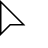
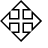
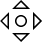
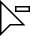
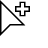

In [ ]:
from raiwidgets import ErrorAnalysisDashboard
predictions = model_hp.predict(X_test)
features=['DiffractionLoss', 'FoliageLoss','Distance','V','WorstKnifeEdgeDistance','RayExists','RayTotalLength','NumberOfReflection','NumberOfDiffraction']
ErrorAnalysisDashboard(dataset=X_test, true_y=y_test, features=features, pred_y=predictions, model_task='regression')

In [ ]:
from interpret_community.common.constants import ModelTask
# Imports for SHAP MimicExplainer with LightGBM surrogate model
from interpret_community.mimic.mimic_explainer import MimicExplainer
from interpret_community.mimic.mimic_explainer import LGBMExplainableModel


# Train the LightGBM surrogate model using MimicExplaner
model_task = ModelTask.Regression
explainer = MimicExplainer(model_hp, X_train, LGBMExplainableModel,
                           augment_data=True, max_num_of_augmentations=10,
                           features=features, model_task=model_task)

global_explanation = explainer.explain_global(X_test)

31/31 [==============================] - 0s 1ms/step
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 721
[LightGBM] [Info] Number of data points in the train set: 981, number of used features: 7
[LightGBM] [Info] Start training from score 102.173102
11/11 [==============================] - 0s 2ms/step


11/11 [==============================] - 0s 2ms/step


ErrorAnalysis started at http://localhost:5002



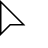
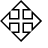
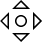
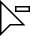
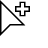

In [ ]:
ErrorAnalysisDashboard(global_explanation, model_hp, dataset=X_test, true_y=y_test)